# Title / Topic
**Drive Smart, Maximise Profits: Data-Driven Insights to Boost NYC Taxi Company Revenue**  
*Key Question:* *How can taxi companies leverage trip data to increase total revenue and optimise fleet performance in New York City?*  


# Background
Running a taxi company in New York City has never been more challenging. With rideshare apps like Uber and Lyft now handling over 75% of for-hire vehicle trips, traditional cabs are fighting to stay competitive. For many taxi companies and drivers, the key to survival is no longer about just driving. It’s about driving smarter.

This project explores real New York City taxi trip data to uncover revenue-boosting insights. By analysing where, when, and how money is made on the streets, we aim to help taxi operators make more informed decisions and improve their bottom line.

Here’s what we’ll dive into:

1. Top 10 Pickup & Drop-off Spots: Which locations bring in the most revenue?
2. High-Earning Days: Which days of the week are best for business?
3. Rush Hour vs Non-Rush Hour: Is it worth driving in traffic-heavy hours?
4. Rate Code Analysis: Which fare types (e.g. JFK or Newark trips) are the most profitable?
5. Trip Distance vs Revenue: Do longer trips always mean more money, or is there a better balance?
6. Passenger Count Trends: How does the number of passengers affect total revenue? Are solo rides more profitable per mile than group rides?
7. Trip Type Differences: Do different trip types show significant differences in fare or revenue patterns?
8. Traffic Surcharge Analysis: How much does the congestion_surcharge contribute to overall revenue during peak hours?

With this analysis, taxi companies can optimise fleet deployment, refine scheduling, and ultimately increase revenue, even in a highly competitive and evolving market.

# Data
To uncover smart strategies for boosting revenue in New York City’s taxi industry, we’re using real-world data collected by the New York City Taxi & Limousine Commission (TLC). The dataset offers an inside look at thousands of rides, including where trips start and end, how much passengers pay, and what factors influence earnings. You can access the data [here](https://drive.google.com/drive/folders/1NYHIL-RgVPW-HONz4pdzlcbIChF-c37N).

| Column                     | Description                                                                                               |
| -------------------------- | --------------------------------------------------------------------------------------------------------- |
| `VendorID`                 | Taxi provider (1 = Creative Mobile Technologies, 2 = VeriFone Inc.).                                      |
| `lpep_pickup_datetime`     | Date and time when the trip started.                                                                      |
| `lpep_dropoff_datetime`    | Date and time when the trip ended.                                                                        |
| `passenger_count`          | Number of passengers in the vehicle (driver-entered).                                                     |
| `trip_distance`            | Distance traveled in miles, recorded by the taximeter.                                                    |
| `PULocationID`             | TLC Taxi Zone ID where the trip started.                                                                  |
| `DOLocationID`             | TLC Taxi Zone ID where the trip ended.                                                                    |
| `RateCodeID`               | Final rate code used for the trip (e.g., standard rate, JFK, Newark).                                     |
| `store_and_fwd_flag`       | Indicates whether the trip data was temporarily stored before being sent (Y = Yes, N = No).               |
| `payment_type`             | How the passenger paid (e.g., credit card, cash, dispute).                                                |
| `fare_amount`              | Base fare calculated based on time and distance.                                                          |
| `mta_tax`                  | $0.50 tax applied to trips per New York City regulations.                                                 |
| `improvement_surcharge`    | $0.30 surcharge added to all trips.                                                                       |
| `tip_amount`               | Tip recorded for credit card payments (cash tips not included).                                           |
| `total_amount`             | Total amount charged for the trip (excluding cash tips).                                                  |
| `congestion_surcharge`     | Additional fee applied to trips during peak traffic periods.                                              |
| `ehail_fee`                | Booking fee for e-hail (electronic street-hail) rides.                                                    |
| `tolls_amount`             | Any toll charges applied to the trip.                                                                     |
| `trip_type`                | Indicates whether the trip was street-hail (1) or dispatch (2).                                           |
| `extra`                    | Additional charges such as late-night and rush hour surcharges.                                           |

By analysing these features, we can uncover patterns that help taxi companies make smarter business decisions—from identifying high-value routes to optimizing driver shifts and pricing strategies. The goal is to turn data into actionable insights that increase revenue while keeping operations efficient.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import statsmodels.api as sm
import IPython.display as display
from IPython.display import display
from scipy.stats import stats, normaltest, chi2_contingency, mannwhitneyu, ttest_ind, f_oneway

import warnings
warnings.filterwarnings("ignore")

In [2]:
# Load the dataset:
df=pd.read_csv('/Users/rismawidiya01/Downloads/DTI Purwadhika/Document/Module 02/Capstone/NYC TLC Trip Record.csv')
display(df.head(),df.tail())

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1.0,166,143,1.0,2.58,14.9,1.0,0.5,4.03,0.0,NaN,1.0,24.18,1.0,1.0,2.75
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1.0,24,43,1.0,1.81,10.7,1.0,0.5,2.64,0.0,NaN,1.0,15.84,1.0,1.0,0.00
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1.0,223,179,1.0,0.00,7.2,1.0,0.5,1.94,0.0,NaN,1.0,11.64,1.0,1.0,0.00
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1.0,41,238,1.0,1.30,6.5,0.5,1.5,1.70,0.0,NaN,1.0,10.20,1.0,1.0,0.00
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1.0,41,74,1.0,1.10,6.0,0.5,1.5,0.00,0.0,NaN,1.0,8.00,1.0,1.0,0.00


,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
68206,2,2023-01-31 22:29:00,2023-01-31 22:42:00,NaN,NaN,49,62,NaN,4070.82,15.70,0.0,0.0,0.00,0.0,NaN,1.0,16.70,NaN,NaN,NaN
68207,2,2023-01-31 22:40:00,2023-01-31 22:48:00,NaN,NaN,10,205,NaN,2.14,4.41,0.0,0.0,0.00,0.0,NaN,1.0,5.41,NaN,NaN,NaN
68208,2,2023-01-31 23:46:00,2023-02-01 00:02:00,NaN,NaN,66,37,NaN,3.44,16.53,0.0,0.0,3.51,0.0,NaN,1.0,21.04,NaN,NaN,NaN
68209,2,2023-01-31 23:01:00,2023-01-31 23:19:00,NaN,NaN,225,189,NaN,3.03,14.98,0.0,0.0,3.20,0.0,NaN,1.0,19.18,NaN,NaN,NaN
68210,2,2023-01-31 23:51:00,2023-02-01 00:07:00,NaN,NaN,256,140,NaN,5.82,23.65,0.0,0.0,2.00,0.0,NaN,1.0,29.40,NaN,NaN,NaN


# Getting to Know the Data and Cleaning It Up
Before we jump into the analysis, we first need to take a closer look at the dataset. This step is all about understanding what’s inside, spotting any oddities, and making sure everything is clean and reliable. After all, solid insights come from solid data.

By exploring the trip records, we can identify any inconsistencies, missing values, or unusual patterns that might affect our analysis. If something doesn’t look right, we’ll fix it using a mix of domain knowledge and statistical reasoning to keep everything accurate and meaningful.

So, let’s roll up our sleeves and dive into the data to see what we’re working with.

In [3]:
# Data information:
print(f'The number of rows in the dataset is {df.shape}')
df.info()

The number of rows in the dataset is (68211, 20)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68211 entries, 0 to 68210
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   VendorID               68211 non-null  int64  
 1   lpep_pickup_datetime   68211 non-null  object 
 2   lpep_dropoff_datetime  68211 non-null  object 
 3   store_and_fwd_flag     63887 non-null  object 
 4   RatecodeID             63887 non-null  float64
 5   PULocationID           68211 non-null  int64  
 6   DOLocationID           68211 non-null  int64  
 7   passenger_count        63887 non-null  float64
 8   trip_distance          68211 non-null  float64
 9   fare_amount            68211 non-null  float64
 10  extra                  68211 non-null  float64
 11  mta_tax                68211 non-null  float64
 12  tip_amount             68211 non-null  float64
 13  tolls_amount           68211 non-null  float64
 14  ehail

In [4]:
# Data summary:
display(df.describe(), df.describe(include='object'))

,VendorID,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
count,68211.000000,63887.000000,68211.000000,68211.000000,63887.000000,68211.000000,68211.000000,68211.000000,68211.000000,68211.000000,68211.000000,0.0,68211.000000,68211.000000,63887.000000,63877.000000,63887.000000
mean,1.863028,1.117160,98.549735,138.429901,1.315870,8.114852,16.603545,0.825431,0.588340,2.139012,0.169627,NaN,0.951625,21.789377,1.373613,1.021933,0.726748
std,0.343820,1.372913,61.244314,76.761311,0.979054,585.105955,13.470121,1.269904,0.385819,3.052710,1.099789,NaN,0.196875,15.457115,0.508039,0.146465,1.212836
min,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,-70.000000,-2.500000,-0.500000,-10.500000,0.000000,NaN,-1.000000,-71.500000,1.000000,1.000000,-2.750000
25%,2.000000,1.000000,74.000000,74.000000,1.000000,1.110000,9.300000,0.000000,0.500000,0.000000,0.000000,NaN,1.000000,12.900000,1.000000,1.000000,0.000000
50%,2.000000,1.000000,75.000000,138.000000,1.000000,1.850000,13.500000,0.000000,0.500000,1.600000,0.000000,NaN,1.000000,17.900000,1.000000,1.000000,0.000000
75%,2.000000,1.000000,129.000000,219.000000,1.000000,3.210000,19.800000,1.000000,0.500000,3.330000,0.000000,NaN,1.000000,26.150000,2.000000,1.000000,2.750000
max,2.000000,99.000000,265.000000,265.000000,9.000000,120098.840000,490.000000,12.500000,2.750000,222.220000,36.050000,NaN,1.000000,491.000000,5.000000,2.000000,2.750000


,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag
count,68211,68211,63887
unique,66575,66519,2
top,2023-01-09 09:08:00,2023-01-09 00:00:00,N
freq,4,6,63579


In [5]:
# Number of unique data in each column:
pd.set_option('display.max_colwidth', 0)
listItem = []
for col in df.columns :
    listItem.append( [col, df[col].nunique(), df[col].unique()])

tabel1Desc = pd.DataFrame(columns=['Column Name', 'Number of Unique', 'Unique Sample'],
                     data=listItem)
tabel1Desc

,Column Name,Number of Unique,Unique Sample
0,VendorID,2,"[2, 1]"
1,lpep_pickup_datetime,66575,"[2023-01-01 00:26:10, 2023-01-01 00:51:03, 2023-01-01 00:35:12, 2023-01-01 00:13:14, 2023-01-01 00:33:04, 2023-01-01 00:53:31, 2023-01-01 00:09:14, 2023-01-01 00:11:58, 2023-01-01 00:41:29, 2023-01-01 00:50:32, 2023-01-01 00:16:12, 2023-01-01 00:08:43, 2023-01-01 00:26:32, 2023-01-01 00:18:35, 2023-01-01 00:39:32, 2023-01-01 00:49:34, 2023-01-01 00:10:45, 2023-01-01 00:35:11, 2023-01-01 00:31:06, 2023-01-01 00:14:37, 2023-01-01 00:26:21, 2023-01-01 00:41:56, 2023-01-01 00:32:02, 2023-01-01 00:55:13, 2023-01-01 00:01:31, 2023-01-01 00:22:31, 2023-01-01 00:57:28, 2023-01-01 00:35:21, 2023-01-01 00:52:52, 2023-01-01 00:32:56, 2023-01-01 00:24:01, 2023-01-01 00:46:48, 2023-01-01 00:40:58, 2023-01-01 00:20:23, 2023-01-01 01:49:24, 2023-01-01 00:41:53, 2023-01-01 00:56:26, 2023-01-01 00:33:10, 2023-01-01 00:58:28, 2023-01-01 00:42:49, 2023-01-01 00:48:21, 2023-01-01 00:08:05, 2023-01-01 00:13:47, 2023-01-01 00:16:10, 2023-01-01 00:04:25, 2023-01-01 00:33:38, 2023-01-01 00:46:08, 2023-01-01 01:00:08, 2023-01-01 00:28:04, 2023-01-01 00:23:04, 2023-01-01 00:34:07, 2023-01-01 00:52:03, 2023-01-01 00:25:31, 2023-01-01 00:53:09, 2023-01-01 00:42:37, 2023-01-01 00:39:52, 2023-01-01 00:15:32, 2023-01-01 00:06:48, 2023-01-01 00:57:15, 2023-01-01 00:14:13, 2023-01-01 00:52:48, 2023-01-01 00:34:13, 2023-01-01 00:44:41, 2023-01-01 00:11:12, 2023-01-01 01:44:43, 2023-01-01 01:04:44, 2023-01-01 01:48:11, 2023-01-01 01:11:39, 2023-01-01 01:54:25, 2023-01-01 01:59:10, 2023-01-01 01:22:35, 2023-01-01 01:37:10, 2023-01-01 01:46:22, 2023-01-01 01:59:48, 2023-01-01 01:09:49, 2023-01-01 01:23:35, 2023-01-01 01:53:20, 2023-01-01 01:32:14, 2023-01-01 01:01:05, 2023-01-01 01:34:41, 2023-01-01 01:52:08, 2023-01-01 01:49:28, 2023-01-01 01:03:59, 2023-01-01 01:13:11, 2023-01-01 01:40:06, 2023-01-01 01:33:50, 2023-01-01 01:45:19, 2023-01-01 01:51:29, 2023-01-01 01:34:07, 2023-01-01 01:10:08, 2023-01-01 01:32:17, 2023-01-01 01:48:28, 2023-01-01 01:30:43, 2023-01-01 01:51:10, 2023-01-01 01:09:36, 2023-01-01 01:19:54, 2023-01-01 01:31:10, 2023-01-01 01:42:30, 2023-01-01 00:57:51, 2023-01-01 01:27:36, ...]"
2,lpep_dropoff_datetime,66519,"[2023-01-01 00:37:11, 2023-01-01 00:57:49, 2023-01-01 00:41:32, 2023-01-01 00:19:03, 2023-01-01 00:39:02, 2023-01-01 01:11:04, 2023-01-01 00:26:39, 2023-01-01 00:24:55, 2023-01-01 00:46:26, 2023-01-01 01:13:42, 2023-01-01 00:41:43, 2023-01-01 00:17:08, 2023-01-01 00:45:31, 2023-01-01 00:30:09, 2023-01-01 01:18:06, 2023-01-01 01:08:23, 2023-01-01 00:19:37, 2023-01-01 01:17:35, 2023-01-01 00:42:23, 2023-01-01 00:21:50, 2023-01-01 00:30:26, 2023-01-01 00:46:06, 2023-01-01 00:41:25, 2023-01-01 00:59:47, 2023-01-01 00:16:02, 2023-01-01 00:39:24, 2023-01-01 01:09:31, 2023-01-01 00:53:49, 2023-01-01 01:00:53, 2023-01-01 00:42:53, 2023-01-01 00:32:05, 2023-01-01 01:08:17, 2023-01-01 01:04:32, 2023-01-01 00:24:32, 2023-01-01 01:57:51, 2023-01-01 00:41:58, 2023-01-01 01:14:41, 2023-01-01 00:43:08, 2023-01-01 01:14:46, 2023-01-01 00:51:53, 2023-01-01 01:23:50, 2023-01-01 00:13:26, 2023-01-01 00:25:57, 2023-01-01 00:54:55, 2023-01-01 00:17:50, 2023-01-01 00:38:51, 2023-01-01 00:59:10, 2023-01-01 01:05:46, 2023-01-01 00:43:45, 2023-01-01 23:18:32, 2023-01-01 00:50:01, 2023-01-01 00:57:56, 2023-01-01 00:38:40, 2023-01-01 01:13:35, 2023-01-01 00:47:15, 2023-01-01 00:48:54, 2023-01-01 00:23:03, 2023-01-01 01:08:47, 2023-01-01 01:00:15, 2023-01-01 00:25:43, 2023-01-01 01:21:19, 2023-01-01 00:43:57, 2023-01-01 00:48:26, 2023-01-01 00:38:12, 2023-01-01 01:57:31, 2023-01-01 01:11:23, 2023-01-01 02:05:51, 2023-01-01 01:41:21, 2023-01-01 02:05:19, 2023-01-01 02:11:36, 2023-01-01 01:25:11, 2023-01-01 01:41:30, 2023-01-01 02:04:14, 2023-01-01 02:05:29, 2023-01-01 01:17:55, 2023-01-01 01:53:43, 2023-01-01 02:27:01, 2023-01-01 01:43:55, 2023-01-01 01:13:02, 2023-01-01 02:00:06, 2023-01-01 02:00:57, 2023-01-01 02:13:18, 2023-01-01 01:07:17, 2023-01-01 01:26:01, 2

After taking an initial look at the dataset, here are some key things that stand out:

1. The dataset has 20 columns, covering everything from trip timestamps and locations to passenger counts, fares, and payment methods.
2. Some columns like `store_and_fwd_flag`, `RatecodeID`, `passenger_count`, `payment_type`, and `trip_type` have missing values (NaN). We’ll need to dig deeper to decide whether to fill, remove, or leave them as they are.
3. The `ehail_fee` column is entirely empty, which means it’s probably not useful and might as well be dropped.
4. Pickup and drop-off timestamps (`lpep_pickup_datetime` and `lpep_dropoff_datetime`) could reveal a lot, like trip duration and the busiest hours for rides.
5. The `passenger_count` column sometimes has a 0, which doesn’t seem right. That could be a mistake or missing data, so it’s worth investigating.
6. The `trip_distance` values are all over the place including some trips recorded as 0.0 miles. That might mean errors, cancelled rides, or just really short trips. We’ll need to clean this up.
7. The `RatecodeID` column has a weird value of 99.0, which isn’t in the official rate categories. That’s another thing to check.
8. Some categories, like `payment_type` and `trip_type`, might work better if we convert them into numbers, making it easier to analyse and visualise trends.

Now that we’ve spotted these quirks, our next step is to clean things up and get the data ready for deeper analysis and Tableau visualisations.

# Data Type Conversion

In [6]:
# Converting columns to numeric (integer):
df['payment_type'] = df['payment_type'].astype('Int64')
df['trip_type'] = df['trip_type'].astype('Int64')
df.dtypes

VendorID                 int64  
lpep_pickup_datetime     object 
lpep_dropoff_datetime    object 
store_and_fwd_flag       object 
RatecodeID               float64
PULocationID             int64  
DOLocationID             int64  
passenger_count          float64
trip_distance            float64
fare_amount              float64
extra                    float64
mta_tax                  float64
tip_amount               float64
tolls_amount             float64
ehail_fee                float64
improvement_surcharge    float64
total_amount             float64
payment_type             Int64  
trip_type                Int64  
congestion_surcharge     float64
dtype: object

# Missing Values

In [7]:
# Percentage of missing values in each column:
df.isna().sum()/df.shape[0]*100

VendorID                 0.000000  
lpep_pickup_datetime     0.000000  
lpep_dropoff_datetime    0.000000  
store_and_fwd_flag       6.339154  
RatecodeID               6.339154  
PULocationID             0.000000  
DOLocationID             0.000000  
passenger_count          6.339154  
trip_distance            0.000000  
fare_amount              0.000000  
extra                    0.000000  
mta_tax                  0.000000  
tip_amount               0.000000  
tolls_amount             0.000000  
ehail_fee                100.000000
improvement_surcharge    0.000000  
total_amount             0.000000  
payment_type             6.339154  
trip_type                6.353814  
congestion_surcharge     6.339154  
dtype: float64

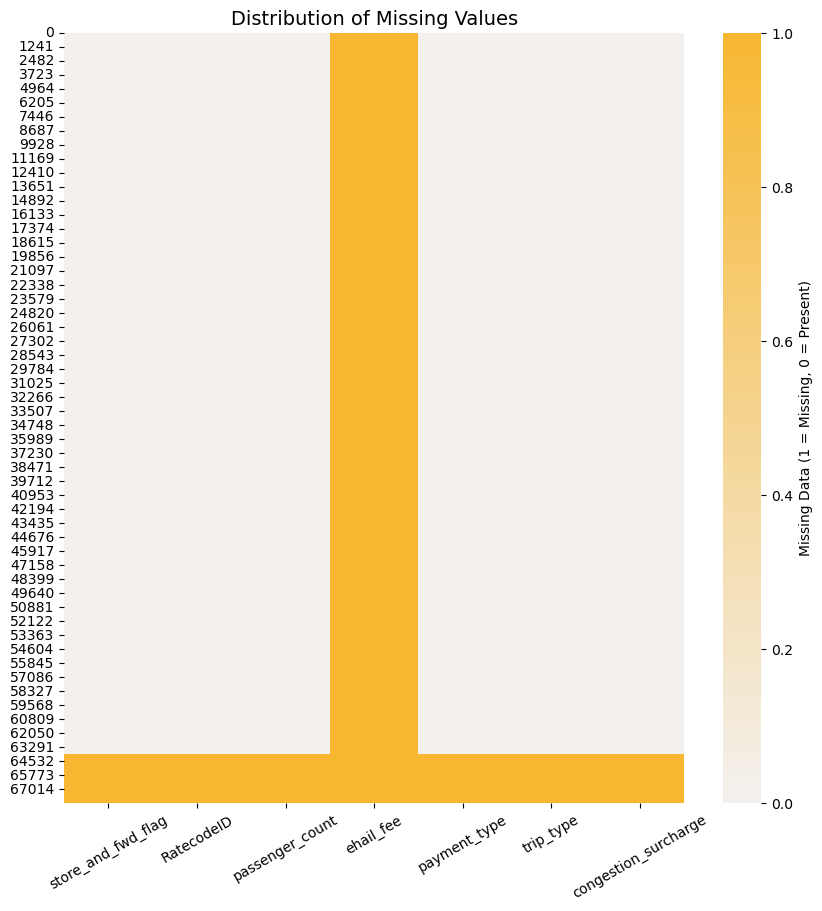

In [8]:
# Defining the custom colourmap:
custom_cmap = sns.light_palette("#F7B731", as_cmap=True)

# Defining figure size:
plt.figure(figsize=(10, 10))

# Creating heatmap with colour bar:
ax = sns.heatmap(df[['store_and_fwd_flag', 'RatecodeID', 'passenger_count', 'ehail_fee', 
                      'payment_type', 'trip_type', 'congestion_surcharge']].isna(), 
                 cmap=custom_cmap, 
                 cbar=True)

# Customising colour bar:
cbar = ax.collections[0].colorbar
cbar.set_label("Missing Data (1 = Missing, 0 = Present)", fontsize=10)
cbar.ax.tick_params(labelsize=10)

plt.xticks(rotation=30)
plt.title("Distribution of Missing Values", fontsize=14)
plt.show()

Looking at the missing values, here’s what we found:

- The `ehail_fee` column is completely empty (100% missing), meaning it doesn’t give us any useful information. It makes sense to just drop it.
- Other columns like `store_and_fwd_flag`, `RatecodeID`, `passenger_count`, `payment_type`, `trip_type`, and `congestion_surcharge` have around 6.3% missing values. Instead of deleting rows, which could mean losing valuable data, we’ll take a smarter approach to filling in the gaps.

### How We’ll Handle the Missing Data:
Rather than just removing rows, we’ll fill in the blanks based on logical patterns:

- `store_and_fwd_flag` → This tells us if trip data was temporarily stored before being sent. Since most values are ‘N’ (No), it’s safe to assume the missing ones are also ‘N’.
- `RatecodeID` → This represents different fare types (like standard rates or airport trips). Since one category is likely the most common, we’ll fill in missing values with the most frequent rate type.
- `passenger_count` → This shows how many passengers were in the taxi. Since this number can vary, we’ll use the median value (instead of the average) to avoid extreme outliers skewing the data.
- `payment_type` → Since passengers mostly pay in one or two common ways, we’ll fill in missing values using the most frequent payment method.
- `trip_type` → If most trips are standard, we’ll assume missing values belong to this common category.
- `congestion_surcharge` → This is a fixed charge applied to certain trips. Instead of guessing, we’ll use the average surcharge to replace missing values.

By using these logical replacements, we keep as much data as possible while ensuring accuracy. This way, we avoid throwing away useful insights and make the dataset ready for deeper analysis.

### `ehail_fee`

In [9]:
# Dropping ehail_fee:
df.drop(columns=['ehail_fee'], inplace=True)

Reasoning:
- It’s completely empty which means every single value is missing, so there’s nothing to work with.
- There’s no way to guess what the values should be based on other data.
- Dropping it makes the dataset cleaner and easier to work with without losing any valuable insights.

### `store_and_fwd_flag`

In [10]:
# Filling missing values with N:
df['store_and_fwd_flag'].fillna('N', inplace=True)

Reasoning:
- This column is basically a yes/no flag, so it’s straightforward.
- Since most trips have the same value, it makes sense to assume missing ones follow the same pattern.
- Filling in the most common value keeps things consistent and avoids adding unnecessary randomness.

### `RatecodeID`

In [11]:
# RatecodeID = 99.0:
print(df['RatecodeID'].value_counts())
print(df[df['RatecodeID'] == 99.0])

RatecodeID
1.0     62103
5.0     1529 
2.0     158  
4.0     57   
3.0     30   
99.0    10   
Name: count, dtype: int64
       VendorID lpep_pickup_datetime lpep_dropoff_datetime store_and_fwd_flag  \
1084   1         2023-01-01 19:44:13  2023-01-01 19:58:30   N                   
2174   1         2023-01-02 16:39:05  2023-01-02 17:31:42   N                   
9055   1         2023-01-05 20:33:45  2023-01-05 22:46:41   N                   
14125  1         2023-01-08 11:36:41  2023-01-08 12:14:59   N                   
29143  1         2023-01-15 13:51:42  2023-01-15 14:37:38   N                   
29711  1         2023-01-15 17:52:52  2023-01-15 22:11:55   N                   
35975  1         2023-01-19 01:07:59  2023-01-19 01:17:19   N                   
37691  1         2023-01-19 17:16:59  2023-01-19 22:29:53   N                   
42432  1         2023-01-21 20:29:58  2023-01-22 02:59:25   N                   
45204  1         2023-01-23 13:45:11  2023-01-23 23:36:42   N        

In [12]:
# Marking them as missing (NaN):
df['RatecodeID'] = df['RatecodeID'].replace(99.0, np.nan)

In [13]:
# Filling missing values with mode within each trip_type:
df['RatecodeID'] = df.groupby('trip_type')['RatecodeID'].transform(lambda x: x.fillna(x.mode()[0]))

Reasoning:
- Since we found unexpected values (99), treating them as missing and replacing them ensures accuracy.
- Different types of trips may have different fare structures, but the most common value (mode) gives us the best estimate.
- This method keeps the data clean and consistent while avoiding unnecessary assumptions.

### `passenger_count`

In [14]:
# Filling missing values with median based on trip_type:
df['passenger_count'] = df.groupby('trip_type')['passenger_count'].transform(lambda x: x.fillna(x.median()))

Reasoning:
- Most taxi trips tend to have one passenger, but there are occasional larger group rides that could skew the data.
- Instead of using the average (mean), which can be distorted by outliers, the median gives a more realistic estimate.
- Grouping by trip type makes sense. Shared rides and solo trips have different typical passenger counts, so this approach keeps things accurate.

### `payment_type`

In [15]:
# Filling missing values with mode within RatecodeID:
df['payment_type'] = df.groupby('RatecodeID')['payment_type'].transform(lambda x: x.fillna(x.mode()[0]))

Reasoning:
- Different trips have different preferred payment methods. For example, corporate rides are more likely to be paid by credit card, while street pickups might be paid in cash.
- Instead of making random guesses, we fill in missing values with the most common payment method for each RatecodeID (fare type).
- This keeps the data realistic and ensures we’re not introducing any weird patterns that don’t actually happen in New York City taxi rides.

### `trip_type`

In [16]:
# Filling missing values with mode within RatecodeID:
df['trip_type'] = df.groupby('RatecodeID')['trip_type'].transform(lambda x: x.fillna(x.mode()[0]))

Reasoning:
- Trip type tells us whether a ride was a standard street pickup or a pre-arranged trip.
- Since different RatecodeIDs (fare types) are usually tied to specific trip types, it makes sense to fill in missing values based on what’s most common for each fare type.
- This way, we’re keeping the data consistent and logical, ensuring that every trip is classified in a way that makes sense in the real world.

### `congestion_surchage`

In [17]:
# Filling missing values with mean based on RatecodeID:
df['congestion_surcharge'] = df.groupby('RatecodeID')['congestion_surcharge'].transform(lambda x: x.fillna(x.mean()))

Reasoning:
- The congestion surcharge is a fixed fee that depends on New York City regulations and how a trip is classified.
- Since different RatecodeIDs (fare types) have their own pricing rules, the surcharge is likely linked to them.
- By filling in the missing values with the average for each fare type, we’re making sure the data stays realistic and aligned with how pricing actually works.

In [18]:
# Verifying missing values are handled:
print(df.isnull().sum())

VendorID                 0   
lpep_pickup_datetime     0   
lpep_dropoff_datetime    0   
store_and_fwd_flag       0   
RatecodeID               4334
PULocationID             0   
DOLocationID             0   
passenger_count          4334
trip_distance            0   
fare_amount              0   
extra                    0   
mta_tax                  0   
tip_amount               0   
tolls_amount             0   
improvement_surcharge    0   
total_amount             0   
payment_type             4334
trip_type                4334
congestion_surcharge     4334
dtype: int64


After all the careful data cleaning, we’re left with exactly 4,334 rows still missing values across multiple key columns (RatecodeID, passenger_count, payment_type, trip_type, and congestion_surcharge). This pattern isn’t random. It strongly suggests these rows are incomplete in more ways than we can see.

### What This Tells Us:
- Since these fields are interconnected, their missing values likely mean the entire trip record is unreliable.
- We’ve already filled in missing values where it made sense, using logical correlations. But for these rows, there’s just not enough information to make accurate assumptions.
- Trying to force-fill these gaps could introduce bias or distort the dataset.

### Best Move:
- Drop these 4,334 rows.
- Instead of patching together incomplete data, removing them ensures we’re working with a dataset that’s both clean and trustworthy.

### What This Means for Our Data:
At the start, we had 68,211 rows, but 4,334 of them have missing values spread across multiple key columns.

### How Much We Are Losing:
(4,334 / 68,211) × 100 ≈ 6.36% of the data.

### Why This Isn’t a Big Deal:
- Losing 6.36% is a small trade-off for better data quality.
- These rows are missing too much critical information, making them unreliable.
- If we tried to fill in gaps with averages or most common values, we’d risk skewing important insights (like `RatecodeID`, `payment_type`, and `trip_type`).

In [19]:
# Dropping the remaining missing values:
df.dropna(inplace=True)

In [20]:
# Verifying the remaining missing values are handled:
print(df.isnull().sum())

VendorID                 0
lpep_pickup_datetime     0
lpep_dropoff_datetime    0
store_and_fwd_flag       0
RatecodeID               0
PULocationID             0
DOLocationID             0
passenger_count          0
trip_distance            0
fare_amount              0
extra                    0
mta_tax                  0
tip_amount               0
tolls_amount             0
improvement_surcharge    0
total_amount             0
payment_type             0
trip_type                0
congestion_surcharge     0
dtype: int64


In [21]:
# Dropping duplicates:
df = df.drop_duplicates()

print("Data after dropping duplicates:", df.shape)

Data after dropping duplicates: (63877, 19)


### Correlation Heatmap:

In [22]:
# Calculating total revenue per trip (including fare + surcharges + tolls):
df['total_revenue'] = (
    df['fare_amount'] +
    df['extra'] +
    df['mta_tax'] +
    df['improvement_surcharge'] +
    df['congestion_surcharge'] +
    df['tolls_amount']
)

# Checking the first few rows:
df[['fare_amount', 'extra', 'mta_tax', 'improvement_surcharge', 
            'congestion_surcharge', 'tolls_amount', 'total_revenue']].head()

,fare_amount,extra,mta_tax,improvement_surcharge,congestion_surcharge,tolls_amount,total_revenue
0,14.9,1.0,0.5,1.0,2.75,0.0,20.15
1,10.7,1.0,0.5,1.0,0.00,0.0,13.20
2,7.2,1.0,0.5,1.0,0.00,0.0,9.70
3,6.5,0.5,1.5,1.0,0.00,0.0,9.50
4,6.0,0.5,1.5,1.0,0.00,0.0,9.00


In [23]:
# Selecting only numeric columns for correlation:
numeric_cols = [
    "VendorID", "RatecodeID", "PULocationID", "DOLocationID", 
    "passenger_count", "trip_distance", "extra", 
    "mta_tax", "tolls_amount", "improvement_surcharge", 
    "total_revenue", "payment_type", "trip_type", "congestion_surcharge"
]

# Computing correlation:
corr = df[numeric_cols].corr()

# Creating heatmap:
fig = px.imshow(
    corr,
    text_auto=True,
    color_continuous_scale="ylorrd",
    zmin=-1, zmax=1,
    aspect="auto"
)

# Updating layout:
fig.update_layout(
    title="Correlation Heatmap of Taxi Trip Features",
    title_font=dict(color="white", size=22),
    xaxis_title="Features",
    yaxis_title="Features",
    xaxis=dict(title_font=dict(color="white"), tickfont=dict(color="white")),
    yaxis=dict(title_font=dict(color="white"), tickfont=dict(color="white")),
    plot_bgcolor="rgba(0,0,0,0)",
    paper_bgcolor="rgba(0,0,0,0)",
    width=1280,                   
    height=720
)

fig.show()


In [24]:
# Correlation of all features with total_revenue (excluding itself):
revenue_corr = corr["total_revenue"].drop("total_revenue").round(3)

print("Correlation of Features with Total Revenue:\n")
print(revenue_corr)

Correlation of Features with Total Revenue:

VendorID                -0.047
RatecodeID               0.170
PULocationID             0.092
DOLocationID             0.128
passenger_count          0.013
trip_distance            0.303
extra                    0.134
mta_tax                  0.028
tolls_amount             0.376
improvement_surcharge    0.092
payment_type            -0.082
trip_type                0.129
congestion_surcharge     0.235
Name: total_revenue, dtype: float64


#### Analysis:

The correlation coefficients indicate the strength and direction of linear relationships between each feature and total revenue. Key findings:

1. **Strongest Revenue Drivers**:
- Tolls amount (0.376) → Longer trips with tolls generate more revenue.
- Trip distance (0.303) → Longer trips correlate with higher fares.
- Congestion surcharge (0.235) → Trips during congestion add incremental revenue.

2. **Moderate influencers**:
- RatecodeID (0.170), extra (0.134), trip_type (0.129), pickup and drop-off locations (0.092–0.128).

3. **Minimal impact**:
- VendorID (-0.047), passenger_count (0.013), mta_tax (0.028), payment_type (-0.082).

**Operational Implications**:
- **Driver allocation**: Prioritize high-revenue zones and peak congestion periods to maximise earnings.
- **Trip planning**: Encourage longer trips and optimize routes through toll-heavy areas where feasible.
- **Incentives**: Focus on strategies to boost tips (e.g., service quality, promotions).
- **Resource efficiency**: Low-impact factors (vendor, passenger count, payment type) can be deprioritised in operational planning.

### Dropping Columns That Don't Add Much Value:
To keep our analysis clean and focused on what truly impacts company revenue, we’re removing several columns that don’t directly contribute to our key business questions:

- `VendorID` → Identifies which taxi provider handled the ride. Since we’re not comparing companies, this doesn’t add much value.
- `store_and_fwd_flag` → Indicates how data was transmitted (stored vs sent live), which is more technical than revenue-related.
- `tip_amount` → Tips go directly to the driver and aren’t part of company revenue.
- `payment_type` → Shows how the rider paid (cash, card, etc.), but doesn’t influence how much revenue is earned.

By dropping these columns, we can simplify our dataset and stay focused on the metrics that matter most for increasing taxi company revenue.

In [25]:
# Dropping unnecessary columns:
columns_to_drop = ["VendorID", "store_and_fwd_flag", "tip_amount", "payment_type"]
df = df.drop(columns=columns_to_drop)

In [26]:
# Summary of cleaned dataset:
listItem = []
for col in df.columns:
    listItem.append([
        col, 
        df[col].dtype, 
        df[col].isna().sum(), 
        df[col].nunique(), 
        list(df[col].drop_duplicates().sample(2).values)
    ])

dfDesc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'unique', 'uniqueSample'], 
                      data=listItem)

print(df.shape)
dfDesc

(63877, 16)


,dataFeatures,dataType,null,unique,uniqueSample
0,lpep_pickup_datetime,object,0,62665,"[2023-01-29 23:05:01, 2023-01-02 12:28:48]"
1,lpep_dropoff_datetime,object,0,62602,"[2023-01-26 07:54:50, 2023-01-16 15:59:17]"
2,RatecodeID,float64,0,5,"[3.0, 5.0]"
3,PULocationID,int64,0,222,"[203, 191]"
4,DOLocationID,int64,0,248,"[48, 201]"
5,passenger_count,float64,0,10,"[8.0, 2.0]"
6,trip_distance,float64,0,1727,"[18.3, 8.14]"
7,fare_amount,float64,0,463,"[154.9, 19.7]"
8,extra,float64,0,16,"[2.75, 6.0]"
9,mta_tax,float64,0,6,"[-0.5, 0.0]"


# Outliers Handling

In [27]:
# Numeric columns:
num_cols = [
    'RatecodeID', 'PULocationID', 'DOLocationID', 'passenger_count',
    'trip_distance', 'fare_amount', 'extra', 'mta_tax', 'tolls_amount',
    'improvement_surcharge', 'trip_type', 'congestion_surcharge', 'total_amount'
]

# Function to detect outliers with IQR:
def detect_outliers(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    return {
        'column': col,
        'Q1': Q1,
        'Q3': Q3,
        'IQR': IQR,
        'lower_bound': lower_bound,
        'upper_bound': upper_bound,
        'num_outliers': outliers.shape[0],
        'pct_outliers': round(100 * outliers.shape[0] / df.shape[0], 2)
    }

# Applying function to all numeric columns:
outlier_report = pd.DataFrame([detect_outliers(df, col) for col in num_cols])

# Displaying summary:
print(outlier_report)

                   column    Q1      Q3     IQR  lower_bound  upper_bound  \
0   RatecodeID             1.0   1.00    0.00    1.000        1.000         
1   PULocationID           74.0  117.00  43.00   9.500        181.500       
2   DOLocationID           74.0  220.00  146.00 -145.000      439.000       
3   passenger_count        1.0   1.00    0.00    1.000        1.000         
4   trip_distance          1.1   3.05    1.95   -1.825        5.975         
5   fare_amount            9.0   19.10   10.10  -6.150        34.250        
6   extra                  0.0   1.00    1.00   -1.500        2.500         
7   mta_tax                0.5   0.50    0.00    0.500        0.500         
8   tolls_amount           0.0   0.00    0.00    0.000        0.000         
9   improvement_surcharge  1.0   1.00    0.00    1.000        1.000         
10  trip_type              1.0   1.00    0.00    1.000        1.000         
11  congestion_surcharge   0.0   2.75    2.75   -4.125        6.875         

| Column                   | % Outliers | Interpretation                                                                                                          |
| ------------------------ | ---------- | ------------------------------------------------------------------------------------------------------------------------|
| `RatecodeID`             | 2.78%      | Small number of trips with invalid rate codes; remove these to ensure all trips follow standard codes.                  |
| `PULocationID`           | 13.82%     | Pickup locations outside the valid range (1–265); remove as they are invalid.                                           |
| `DOLocationID`           | 0%         | All drop-off locations are within valid range. No action needed.                                                        |
| `passenger_count`        | 15.01%     | Trips with 0 or > 6 passengers are invalid; remove these rows.                                                          |
| `trip_distance`          | 8.35%      | Extreme short or long distances; remove unrealistic values (< 0, < 1 mile with fare < $2, > 50 miles with < $0.5/mile). |
| `fare_amount`            | 6.48%      | Remove negative or unrealistically low/high fares.                                                                      |
| `extra`                  | 5.61%      | Remove negative values; otherwise retain.                                                                               |
| `mta_tax`                | 16.97%     | Remove negative values; otherwise retain (normally $0.50).                                                              |
| `tolls_amount`           | 2.18%      | Remove negative values; otherwise retain.                                                                               |
| `improvement_surcharge`  | 6.64%      | Remove negative values; otherwise retain (normally $0.30).                                                              |
| `trip_type`              | 2.19%      | Remove invalid types to ensure consistency.                                                                             |
| `congestion_surcharge`   | 0%         | No outliers; retain all values.                                                                                         |
| `total_amount`           | 5.81%      | Includes fare + extras + tolls + surcharges; remove negative or unrealistically high/low total amounts.                 |

### Outlier Removal Considerations:

1. Kept Data Points:
- Fairly Priced Long Trips: Long-distance trips beyond the Q3 of `trip_distance` (~3 miles) are kept if `fare_amount` grows proportionally (> $1.5–$2 per mile).
- Short Trips with Reasonable Fares: Trips below Q1 (~1 mile) are kept if `fare_amount` is within a realistic range ($5–$20).
- Zero Distance but Charged Fares: Trips with `trip_distance` = 0 are kept only if `fare_amount` > 0.
- Valid Surcharges/Fees: Small fixed surcharges and fees (`extra`, `mta_tax`, `improvement_surcharge`, `congestion_surcharge`, `tolls_amount`) within policy bounds are retained.
- Total Amount: Trips with valid `total_amount` are retained; extreme or negative totals are removed.

2. Removed Data Points:
- Negative or Impossible Values: `fare_amount` ≤ 0, `trip_distance` < 0, negative surcharges/taxes.
- Underpriced Long Trips: `trip_distance` > 50 miles and `fare_amount` < $0.50/mile.
- Overpriced Short Trips: `trip_distance` ≤ 5 miles with `fare_amount` > $50 or `fare_amount` > 50 × `trip_distance`.
- Suspiciously Cheap Trips: `trip_distance` < 1 mile with `fare_amount` < $2.
- Passenger Count Errors: `passenger_count` = 0 or > 6.
- Invalid Location Codes: `PULocationID` or `DOLocationID` outside 1–265.
- Invalid Rate Codes / Trip Types: Trips with `RatecodeID` or `trip_type` outside standard allowed values.
- Invalid Total Amounts: Negative or unrealistically low/high `total_amount` entries.

In [28]:
# Copy of original data:
df_cleaned = df.copy()

# Removing invalid fares or distances:
df_cleaned = df_cleaned[
    (df_cleaned['fare_amount'] > 0) & 
    (df_cleaned['trip_distance'] >= 0)
]

# Removing underpriced long trips (> 50 miles, fare < $0.50/mile):
df_cleaned = df_cleaned[~(
    (df_cleaned['trip_distance'] > 50) & 
    (df_cleaned['fare_amount'] < df_cleaned['trip_distance'] * 0.5)
)]

# Removing overpriced short trips (≤5 miles, fare > $50 or fare > 50 × distance):
df_cleaned = df_cleaned[~(
    (df_cleaned['trip_distance'] <= 5) & 
    ((df_cleaned['fare_amount'] > 50) | 
     (df_cleaned['fare_amount'] > df_cleaned['trip_distance'] * 50))
)]

# Removing suspiciously cheap short trips (< 1 mile, fare < $2):
df_cleaned = df_cleaned[~(
    (df_cleaned['trip_distance'] < 1) & 
    (df_cleaned['fare_amount'] < 2)
)]

# Removing passenger count errors (0 or > 6):
df_cleaned = df_cleaned[
    (df_cleaned['passenger_count'] >= 1) & 
    (df_cleaned['passenger_count'] <= 6)
]

# Removing invalid location codes (outside 1–265):
df_cleaned = df_cleaned[
    df_cleaned['PULocationID'].between(1, 265) & 
    df_cleaned['DOLocationID'].between(1, 265)
]

# Removing negative surcharge/fee values:
fee_columns = ['extra', 'mta_tax', 'improvement_surcharge', 'congestion_surcharge', 'tolls_amount']
for col in fee_columns:
    if col in df_cleaned.columns:
        df_cleaned = df_cleaned[df_cleaned[col] >= 0]

# Removing negative or unrealistically low/high total_amount (excluding tip):
if 'total_amount' in df_cleaned.columns:
    df_cleaned = df_cleaned[df_cleaned['total_amount'] >= 0]

# Removing rare or invalid RatecodeID and trip_type values:
valid_ratecodes = [1, 2, 3, 4, 5]
df_cleaned = df_cleaned[df_cleaned['RatecodeID'].isin(valid_ratecodes)]

if 'trip_type' in df_cleaned.columns:
    valid_trip_types = [1, 2]
    df_cleaned = df_cleaned[df_cleaned['trip_type'].isin(valid_trip_types)]

print(f"Remaining rows after cleaning: {len(df_cleaned)}")

Remaining rows after cleaning: 59762


### Verifying Outlier Removal:

In [29]:
# Defining columns to visualise:
columns_to_check = [
    'trip_distance', 'fare_amount', 'extra', 'mta_tax', 'tolls_amount',
    'improvement_surcharge', 'trip_type', 'congestion_surcharge', 'total_amount'
]

# Box plots for cleaned data:
for col in columns_to_check:
    fig = px.box(
        df_cleaned,
        y=col,
        title=f'Box Plot of {col.replace("_", " ").title()} After Cleaning',
        color_discrete_sequence=["#F7B731"]
    )
    fig.update_layout(
        yaxis_title=col.replace("_", " ").title(),
        plot_bgcolor="#F9F9F9",
        paper_bgcolor="#F9F9F9",
        title_x=0.5,
        title_font_size=18
    )
    fig.show()

In [30]:
# Saving the cleaned dataset:
df_cleaned.to_csv("NYC TLC Trip Record Cleaned.csv", index=False)

In [31]:
# Data information on cleaned dataset:
print(f'The number of rows in the cleaned dataset is {df_cleaned.shape}')
df_cleaned.info()

The number of rows in the cleaned dataset is (59762, 16)
<class 'pandas.core.frame.DataFrame'>
Index: 59762 entries, 0 to 63886
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   lpep_pickup_datetime   59762 non-null  object 
 1   lpep_dropoff_datetime  59762 non-null  object 
 2   RatecodeID             59762 non-null  float64
 3   PULocationID           59762 non-null  int64  
 4   DOLocationID           59762 non-null  int64  
 5   passenger_count        59762 non-null  float64
 6   trip_distance          59762 non-null  float64
 7   fare_amount            59762 non-null  float64
 8   extra                  59762 non-null  float64
 9   mta_tax                59762 non-null  float64
 10  tolls_amount           59762 non-null  float64
 11  improvement_surcharge  59762 non-null  float64
 12  total_amount           59762 non-null  float64
 13  trip_type              59762 non-null  Int64  
 14  co

After handling missing values and removing outliers, we’re left with 59,762 clean and reliable trip records from the original 68,211, meaning 8,449 entries were excluded from the dataset.

(8,449 / 68,211) × 100 ≈ 12.38% of the data removed.

This reduction is expected given our cleaning focus:

- Invalid fares or distances: We removed trips with negative or zero fares and negative distances.
- Underpriced long trips: Trips longer than 50 miles with fares below $0.50 per mile were excluded.
- Overpriced short trips: Trips ≤ 5 miles with fares above $50 or unusually high compared to distance were removed.
- Suspiciously cheap short trips: Trips under 1 mile with fares below $2 were filtered out.
- Passenger count errors: Trips with 0 or more than 6 passengers were dropped.
- Invalid location codes: Pickups or drop-offs outside the TLC-defined zones (1–265) were removed.
- Negative surcharges/fees: Any negative values in `extra`, `mta_tax`, `improvement_surcharge`, `congestion_surcharge`, or `tolls_amount` were excluded.
- Invalid Rate Codes and Trip Types: Rare or non-standard `RatecodeID` and `trip_type` values were removed for consistency.

By applying these filters, we retained a dataset that accurately reflects realistic and valid taxi trips, providing a reliable basis for revenue-focused analysis. This ensures that insights drawn from the data, such as high-earning locations, peak hours, and trip profitability, are meaningful and actionable for taxi companies.

# Exploratory Data Analysis

In [32]:
# Calculating total revenue per trip (including fare + surcharges + tolls):
df_cleaned['total_revenue'] = (
    df_cleaned['fare_amount'] +
    df_cleaned['extra'] +
    df_cleaned['mta_tax'] +
    df_cleaned['improvement_surcharge'] +
    df_cleaned['congestion_surcharge'] +
    df_cleaned['tolls_amount']
)

# Checking the first few rows:
df_cleaned[['fare_amount', 'extra', 'mta_tax', 'improvement_surcharge', 
            'congestion_surcharge', 'tolls_amount', 'total_revenue']].head()

,fare_amount,extra,mta_tax,improvement_surcharge,congestion_surcharge,tolls_amount,total_revenue
0,14.9,1.0,0.5,1.0,2.75,0.0,20.15
1,10.7,1.0,0.5,1.0,0.00,0.0,13.20
3,6.5,0.5,1.5,1.0,0.00,0.0,9.50
4,6.0,0.5,1.5,1.0,0.00,0.0,9.00
5,17.7,1.0,0.5,1.0,2.75,0.0,22.95


In [33]:
# Total revenue:
total_revenue_sum = df_cleaned['total_revenue'].sum()
print("Total Revenue (all trips):", total_revenue_sum)

Total Revenue (all trips): 1149712.79


#### 1. Top 10 Pickup & Drop-off Spots: Which locations bring in the most revenue?

In [34]:
# Grouping by Pickup and Drop-off Locations using total revenue:
top_pickup = df_cleaned.groupby("PULocationID")["total_revenue"].sum().reset_index()
top_dropoff = df_cleaned.groupby("DOLocationID")["total_revenue"].sum().reset_index()

# Selecting top 10 locations based on total revenue:
top_pickup = top_pickup.nlargest(10, "total_revenue")
top_dropoff = top_dropoff.nlargest(10, "total_revenue")

# Converting location IDs to strings for better x-axis readability:
top_pickup["PULocationID"] = top_pickup["PULocationID"].astype(str)
top_dropoff["DOLocationID"] = top_dropoff["DOLocationID"].astype(str)

# Plotting for pickup locations:
fig1 = px.bar(
    top_pickup.sort_values(by="total_revenue", ascending=False),
    x="PULocationID", 
    y="total_revenue", 
    title="Top 10 Pickup Locations by Total Revenue",
    labels={"PULocationID": "Pickup Location", "total_revenue": "Total Revenue ($)"},
    text_auto=True,
    color_discrete_sequence=["#F7B731"]
)
fig1.show()

# Plotting for drop-off locations:
fig2 = px.bar(
    top_dropoff.sort_values(by="total_revenue", ascending=False),
    x="DOLocationID", 
    y="total_revenue", 
    title="Top 10 Drop-off Locations by Total Revenue",
    labels={"DOLocationID": "Drop-off Location", "total_revenue": "Total Revenue ($)"},
    text_auto=True,
    color_discrete_sequence=["#F7B731"]
)
fig2.show()

In [35]:
# Displaying top 10 pickup locations as table:
print("Top 10 Pickup Locations by Total Revenue:")
display(top_pickup.sort_values(by="total_revenue", ascending=False))

# Displaying top 10 drop-off locations as table:
print("Top 10 Drop-off Locations by Total Revenue:")
display(top_dropoff.sort_values(by="total_revenue", ascending=False))

Top 10 Pickup Locations by Total Revenue:


,PULocationID,total_revenue
54,74,219658.19
55,75,155197.50
111,166,66434.56
69,95,64417.70
30,41,58649.80
32,43,55544.80
61,82,54893.05
166,244,44746.80
70,97,39277.15
1,7,30756.60


Top 10 Drop-off Locations by Total Revenue:


,DOLocationID,total_revenue
215,236,45246.92
67,75,40481.14
217,238,38176.45
122,138,37707.00
66,74,36666.10
218,239,30137.50
150,166,28291.11
35,41,27201.40
36,42,26935.35
241,263,26739.43


#### Analysis:

The analysis of total revenue by taxi zones highlights where New York City taxis generate the most income. Key findings:

1. **Pickup Locations**:

Zone 74 leads by a significant margin with **$219,658.19**, followed by Zone 75 with **$155,197.50**. These neighbourhoods consistently produce high passenger demand. Concentrating drivers in these zones during peak hours could help maximise earnings.

**Operational Implications for Pickups**:
- **Driver Allocation**: Assign more drivers to Zones 74, 75, and 166 during peak hours to capture high demand.  
- **Staging Strategy**: Position idle vehicles in nearby feeder zones (e.g., Zones 41, 43, 82) to quickly respond when demand spikes.  
- **Training & Incentives**: Offer incentives for drivers who strategically position themselves in high-revenue pickup areas.

2. **Drop-off Locations**:

Zone 236 generates the most drop-off revenue with **$45,246.92**. Notably, zones 74 and 166 appear in both pickup and drop-off lists, suggesting these areas are high-traffic corridors that reliably generate fares.

**Operational Implications for Drop-offs**:
- **Route Planning**: Since drop-offs frequently land in Zones 236, 75, and 238, companies can predict demand flow and help drivers anticipate where their next fare may come from.  
- **Reduced Deadhead Miles**: Encourage drivers to linger or reposition near overlapping high-revenue drop-off and pickup zones (e.g., Zones 74 & 166) to secure back-to-back rides.  
- **Strategic Partnerships**: Coordinate with event venues, transit hubs, or business centers in top drop-off zones to capture structured demand surges.

#### 2. High-Earning Days: Which days of the week are best for business?

In [36]:
# Ensuring datetime format:
df_cleaned["lpep_pickup_datetime"] = pd.to_datetime(df_cleaned["lpep_pickup_datetime"])

# Converting pickup datetime to actual days of the week:
df_cleaned["DayOfWeek"] = df_cleaned["lpep_pickup_datetime"].dt.day_name()

# Grouping by day of the week and summing total revenue:
daywise_revenue = df_cleaned.groupby("DayOfWeek")["total_revenue"].sum().reset_index()

# Sorting days in logical order:
days_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
daywise_revenue["DayOfWeek"] = pd.Categorical(daywise_revenue["DayOfWeek"], categories=days_order, ordered=True)
daywise_revenue = daywise_revenue.sort_values("DayOfWeek")

# Rounding for readability:
daywise_revenue["total_revenue"] = daywise_revenue["total_revenue"].round(2)

# Plotting bar chart:
fig = px.bar(
    daywise_revenue,
    x="DayOfWeek",
    y="total_revenue",
    title="Total Revenue by Day of the Week",
    labels={"total_revenue": "Total Revenue ($)", "DayOfWeek": "Day of the Week"},
    text="total_revenue",
    color_discrete_sequence=["#F7B731"]
)

fig.update_layout(
    plot_bgcolor="#F9F9F9",
    paper_bgcolor="#F9F9F9",
    title_x=0.5,
    title_font_size=18
)

fig.show()

In [37]:
# Displaying results as a table:
print(daywise_revenue)

   DayOfWeek  total_revenue
1  Monday     167009.36    
5  Tuesday    193347.87    
6  Wednesday  166643.68    
4  Thursday   175134.84    
0  Friday     169264.16    
2  Saturday   141832.64    
3  Sunday     136480.24    


#### Analysis:

Analysing the cleaned NYC taxi dataset by day of the week reveals interesting patterns in revenue generation. Key findings:

1. **Tuesday leads in revenue:**
With $193,347.87 in total revenue, Tuesday emerges as the most profitable day, possibly due to weekday commuter traffic and business trips.

2. **Weekday dominance:**
Overall, weekdays (Monday–Friday) consistently generate higher revenue than weekends, reflecting stronger demand from commuters and business passengers.

3. **Weekend dip:**
Saturday and Sunday show lower revenue ($141,832.64 and $136,480.24 respectively), suggesting that leisure trips or lower ride frequency during weekends contribute less to total revenue.  

4. **Revenue fluctuations:**
Thursday ($175,134.84) is slightly higher than other weekdays except Tuesday, potentially influenced by mid-week events, corporate travel, or pre-weekend activity.  

**Operational Implications:**

- **Driver scheduling:** More drivers can be allocated on high-revenue weekdays, particularly Tuesday and Thursday, to meet demand and maximise earnings.  
- **Dynamic pricing:** Consider incentive programs or surge pricing during peak weekday hours to capture additional revenue.  
- **Weekend strategies:** Promotional offers or targeted services could help improve weekend revenue, offsetting the natural dip in passenger activity.

#### 3. Rush Hour vs. Non-Rush Hour: Is it worth driving in traffic-heavy hours?

In [38]:
# Extracting pickup hour:
df_cleaned['hour'] = pd.to_datetime(df_cleaned['lpep_pickup_datetime']).dt.hour

# Grouping by hour to calculate total revenue:
hourly_revenue = (
    df_cleaned.groupby('hour')['total_revenue']
    .sum()
    .reset_index()
    .sort_values('hour')
)

fig4 = px.line(hourly_revenue,
               x='hour',
               y='total_revenue',
               title="Total Revenue by Hour of the Day",
               labels={'hour': 'Hour of Day', 'total_revenue': 'Total Revenue ($)'},
               markers=True,
               line_shape="linear")

# Customising line colour:
fig4.update_traces(line=dict(color="#F7B731"))

fig4.show()

In [39]:
# Displaying results as a table:
display(hourly_revenue)

,hour,total_revenue
0,0,18176.46
1,1,15167.70
2,2,11037.20
3,3,10554.65
4,4,7712.05
5,5,8072.54
6,6,15250.40
7,7,40446.88
8,8,51396.04
9,9,56079.71


#### Analysis:

This analysis explores **hourly total revenue** generated from NYC taxi trips, calculated as the sum of fare amount, extra charges, MTA tax, improvement surcharge, congestion surcharge, and tolls. Key findings:

1. **Late Night & Early Morning (12 AM – 6 AM)**:
- **Lowest revenue hours:** 3 AM–5 AM, with revenue dropping to as low as **$7,712.05 at 4 AM**.  
- These hours reflect low passenger demand, as most people are at home and fewer businesses are operating.  
- A slight increase is seen at **6 AM ($15,250.40)**, aligning with the start of morning commutes.

2. **Morning Commute (7 AM – 9 AM)**:
- Revenue rises sharply at **7 AM ($40,446.88)** and continues to grow.  
- **Peak morning hour:** **9 AM with $56,079.71**, driven by work commutes, school drop-offs, and business activities.  

3. **Midday Stability (10 AM – 1 PM)**:
- From **10 AM ($59,574.67)** through **1 PM ($66,642.55)**, revenue steadily increases.  
- This suggests consistent demand during late morning and early afternoon, likely from errands, business travel, and lunchtime movement.

4. **Afternoon Peak (2 PM – 6 PM)**:
- **Strong upward trend** in revenue between 2 PM–4 PM.  
- **Highest revenue recorded at 4 PM ($86,646.95)**, followed closely by **5 PM ($95,303.25)** and **6 PM ($94,717.68)**.  
- These are the **busiest hours of the day**, driven by workday endings, after-school pickups, and the start of evening activities.

5. **Evening Demand (7 PM – 9 PM)**:
- Revenue remains high in the evening, with **6 PM–7 PM ($93,401.37)** still among the top-performing hours.  
- After **8 PM ($71,689.81)**, demand begins to taper off as nightlife activity becomes more niche compared to daily commutes.

6. **Late Evening Decline (10 PM – 11 PM)**:
- Revenue continues to decline late at night:  
  - **10 PM ($54,277.35)**  
  - **11 PM ($39,072.75)**  
- This shows fewer rides compared to afternoon/evening peaks, though still higher than the early morning lull.

7. **Nighttime Low (12 AM – 3 AM)**:
- Revenue drops significantly post-midnight, reaching the **day’s lowest levels**:
  - **12 AM ($18,176.46)**  
  - **3 AM ($10,554.65)**  
- This reflects limited demand, mostly from nightlife travel and airport trips.

**Operational Implications:**  
  - Taxi companies should allocate more drivers during **afternoon and evening peaks**.  
  - Reduced fleet presence is efficient during **early morning hours** to minimise idle time.  
  - Incentives or promotions could be targeted at **late evening hours (10 PM – 12 AM)** to capture more rides.

#### 4. Rate Code Analysis: Which fare types (e.g. JFK or Newark trips) are the most profitable?

In [40]:
# Defining mapping for RatecodeID:
rate_code_mapping = {
    1: "Standard Rate",
    2: "JFK",
    3: "Newark",
    4: "Nassau or Westchester",
    5: "Negotiated Fare",
    6: "Group Ride"
}

# Grouping by RatecodeID and calculate total revenue:
rate_code_revenue = (
    df_cleaned.groupby('RatecodeID')['total_revenue']
    .sum()
    .reset_index()
)

# Map descriptive labels:
rate_code_revenue['Rate Code'] = rate_code_revenue['RatecodeID'].map(rate_code_mapping)

# Creating bar chart:
fig = px.bar(
    rate_code_revenue,
    x='Rate Code',
    y='total_revenue',
    title="Total Revenue by Rate Code",
    labels={'total_revenue': 'Total Revenue ($)', 'Rate Code': 'Rate Code'},
    text_auto='.2s',
    color='total_revenue',
    color_continuous_scale=["#EA2027", "#EE5A24", "#F7B731", "#F79F1F"]
)

fig.show()

In [41]:
# Displaying results as a table:
rate_code_revenue = rate_code_revenue[['RatecodeID', 'Rate Code', 'total_revenue']]

print(rate_code_revenue)

   RatecodeID              Rate Code  total_revenue
0  1.0         Standard Rate          1112038.63   
1  2.0         JFK                    8508.90      
2  3.0         Newark                 1801.45      
3  4.0         Nassau or Westchester  5604.90      
4  5.0         Negotiated Fare        21758.91     


#### Analysis:

The table above summarises the **total revenue** generated across different taxi `RatecodeID` categories. Revenue includes fare amount, surcharges, tolls, and other applicable fees. Key findings:

1. **Dominance of Standard Rate (RatecodeID = 1)**:  
   - The **Standard Rate** generates the overwhelming majority of revenue at **over $1.1 million**.  
   - This reflects that the vast majority of taxi trips in NYC fall under the standard metered fare system, which makes sense given that most rides are within city limits.

2. **JFK and Newark Airport Trips (RatecodeID = 2 and 3)**:  
   - JFK airport trips contribute about **$8.5k**, while Newark trips contribute significantly less at **$1.8k**.  
   - This disparity can be attributed to:  
     - JFK being within NYC’s regulated taxi zone and a major hub for outbound/inbound passengers.  
     - Newark being located in New Jersey, where fewer NYC taxis are likely to operate due to jurisdictional and fare regulations.

3. **Nassau/Westchester Trips (RatecodeID = 4)**:  
   - These trips contribute **$5.6k** in revenue, a modest amount compared to JFK.  
   - Trips to these suburban counties are less common and typically only occur when passengers are traveling outside the city.

4. **Negotiated Fare (RatecodeID = 5)**:  
   - Surprisingly, **Negotiated Fare trips** contribute **$21.7k**, which is considerably higher than both JFK and Nassau/Westchester trips combined.  
   - This suggests that while fewer in number, negotiated fares can involve **long-distance or premium-priced trips**, making them a high-value category despite being less frequent.

5. **Group Ride (RatecodeID = 6)**:  
   - No revenue was recorded for **Group Rides** in this dataset.  
   - Possible reasons:  
     - Low adoption of shared rides in the sampled period.  
     - Dataset may not cover the timeframe where shared ride programs were more actively promoted.

**Operational Implications**:
- **Focus on Core Business (Standard Rate):** Since the bulk of revenue is generated from Standard Rate rides, operational improvements (e.g., optimising driver supply during peak hours, reducing idle time, and improving service quality for standard trips) will have the greatest impact on profitability.  
- **Airport & Suburban Market Strategy** Although revenue from JFK, Newark, and Nassau/Westchester is small, these routes can be strategically important. Improving visibility, offering flat fares, or targeted promotions for airport transfers could help capture more of this segment.  
- **Leverage Negotiated Fares** The relatively higher contribution of Negotiated Fares suggests potential in expanding corporate or institutional partnerships. Strengthening these relationships can provide stable, recurring revenue less sensitive to daily fluctuations.  
- **Revenue Diversification** The current revenue distribution shows over-reliance on Standard Rate trips. Exploring ways to **grow specialized markets (airport, negotiated, suburban trips)** could reduce dependency and open new revenue streams.

#### 5. Trip Distance vs. Revenue: Do longer trips always mean more money, or is there a better balance?

In [42]:
# Summarising trips by distance using existing total_revenue column:
df_summary = df_cleaned.groupby('trip_distance', as_index=False).agg(
    total_revenue=('total_revenue', 'sum'),
    trip_count=('trip_distance', 'count')
)

# Creating scatter plot:
fig6 = px.scatter(
    df_summary,
    x='trip_distance',
    y='total_revenue',
    hover_data=['trip_count'],
    title="Trip Distance vs. Total Revenue",
    labels={
        'trip_distance': 'Trip Distance (miles)',
        'total_revenue': 'Total Revenue ($)',
        'trip_count': 'Number of Trips'
    },
    trendline='ols'
)

# Updating marker colour:
fig6.update_traces(marker=dict(color="#F7B731"))

fig6.show()

#### Analysis:
This scatter plot gives us a solid picture of how trip distance relates to total revenue. The main takeaway? Short-distance trips, especially those under 10 miles are driving the bulk of the earnings. These rides happen more often and, even though they’re cheaper individually, they add up fast. We’re seeing clusters of revenue between $500 and $2,000 for many short distances, which shows how valuable high-volume short trips really are.

As trips get longer, total revenue still increases, but the relationship becomes less predictable. Once we pass the 20-mile mark, trips become rarer and the fare amounts start to vary a lot more. That could be due to negotiated rates, discounts, or factors like return-trip uncertainty that aren’t reflected directly in the data.

Interestingly, there are a few very short trips with unusually high revenue. These could be cases where surge pricing kicked in during high-demand periods, or they might involve premium bookings or luxury vehicles.

**Operational Implications**:
- **Focus on High-Volume Short Trips**: Since trips under 10 miles generate most of the revenue, drivers should be strategically positioned in areas where short trips are frequent (e.g., business districts, residential hubs, and transit stations).  
- **Driver Allocation Strategy**: During peak hours, allocating more drivers to short-distance demand zones can maximize fleet utilisation and stabilise earnings.  
- **Pricing & Promotions**: Offering small discounts or loyalty rewards for short trips could encourage even higher demand in this segment, strengthening the company’s core revenue base.
- **Long-Distance Trip Monitoring**: While long trips can bring in higher fares, they are less consistent and more variable in profitability. Monitoring for inefficiencies such as deadhead miles (drivers returning without passengers) can help improve margins.  
- **Investigate Outliers**: Very short trips with unusually high revenue should be reviewed. If caused by surge pricing, this is an opportunity to refine pricing models. If due to errors or fraud, corrective measures may be needed.

#### 6. Passenger Count Trends: How does the number of passengers affect total revenue? Are solo rides more profitable per mile than group rides?

In [43]:
# Aggregating total revenue by passenger_count:
df_passenger_revenue = df_cleaned.groupby('passenger_count', as_index=False).agg(
    total_revenue=('total_revenue', 'sum'),
    trip_count=('passenger_count', 'count'),
    avg_revenue_per_trip=('total_revenue', 'mean')
)

# Creating bar chart:
fig1 = px.bar(
    df_passenger_revenue,
    x='passenger_count',
    y='total_revenue',
    text='trip_count',
    title='Total Revenue by Passenger Count',
    labels={
        'passenger_count': 'Passenger Count',
        'total_revenue': 'Total Revenue ($)'
    },
    color_discrete_sequence=["#F7B731"]
)

fig1.update_layout(
    xaxis_title='Passenger Count',
    yaxis_title='Total Revenue ($)',
    plot_bgcolor="#F9F9F9",
    paper_bgcolor="#F9F9F9",
    title_x=0.5,
    title_font_size=18
)

fig1.show()

In [44]:
# Displaying results as a table:
revenue_by_passenger = (
    df_cleaned.groupby("passenger_count")["total_revenue"]
    .sum()
    .reset_index()
    .sort_values(by="total_revenue", ascending=False)
)

print(revenue_by_passenger)

   passenger_count  total_revenue
0  1.0              969226.79    
1  2.0              100818.60    
4  5.0              35493.65     
2  3.0              18584.20     
5  6.0              18386.75     
3  4.0              7202.80      


#### Analysis:

The analysis explores how total revenue is distributed across trips with different passenger counts. The dataset was aggregated by passenger count, summing the total revenue for each group. Key findings:

1. **Single-passenger trips dominate revenue**:  
   - Trips with only **1 passenger contribute the overwhelming majority** of total revenue ($969k), far outpacing all other categories combined.
   - This indicates that the taxi service is primarily used for individual travel rather than group rides.

2. **Two-passenger trips form a distant second**:  
   - Trips with **2 passengers account for ~$101k**, which is only about **10% of the revenue from single-passenger trips**.
   - Shared rides among two people occur, but at much lower frequency compared to solo trips.

3. **Larger groups (3–6 passengers) are rare and contribute minimally**:  
   - Revenues for 3–6 passenger trips are relatively small (each less than $36k).
   - This suggests that **large-capacity trips are uncommon**, even though vehicles can accommodate them.

4. **Skewed demand profile**:  
   - The revenue distribution is heavily skewed towards solo travel, showing a **concentration of demand among individual riders**.

**Operational Implications**:
- **Fleet Composition & Allocation**: Prioritise **sedan vehicles** or standard cars suitable for individual or two-passenger trips, as these make up the bulk of demand. Reduce reliance on larger vehicles unless required for niche services (e.g., airport runs, events).
- **Driver Scheduling & Route Planning**: Since most trips are solo, **optimise dispatching for efficiency rather than capacity**. This could include shorter wait times and better geographic matching for single-passenger pickups.  
- **Pricing & Promotions**: Consider **targeted promotions for shared/group rides** (3–6 passengers) to increase utilisation of larger-capacity vehicles. Alternatively, **premium solo-travel services** (comfort rides, priority pickups) could be marketed since demand is already strong for individual trips.  
- **Service Strategy**: If maintaining large vehicles, **focus them in high-demand zones** (airports, transit hubs, nightlife areas) where group trips are more likely. Evaluate whether the cost of operating large vehicles justifies their low revenue contribution; scaling them down could reduce operational costs.

#### 7.  Trip Type Differences: Do different trip types show significant differences in fare or revenue patterns?

In [45]:
# Trip type based on total revenue:
fig3 = px.box(
    df_cleaned,
    x='trip_type',
    y='total_revenue',
    points='all',
    title='Trip Type vs Total Revenue',
    color_discrete_sequence= ["#F7B731"]
)
fig3.update_layout(
    xaxis_title='Trip Type (1=Street-Hail, 2=Dispatch)',
    yaxis_title='Total Revenue ($)',
    plot_bgcolor="#F9F9F9",
    paper_bgcolor="#F9F9F9",
    title_x=0.5,
    title_font_size=18
)
fig3.show()

In [46]:
# Displaying results as a table:
trip_type_summary = df_cleaned.groupby('trip_type')['total_revenue'].agg(
    avg_revenue='mean',
    median_revenue='median',
    trip_count='count',
    total_revenue='sum'
).reset_index()

print(trip_type_summary)

   trip_type  avg_revenue  median_revenue  trip_count  total_revenue
0  1          19.108008    15.95           59142       1130085.82   
1  2          31.656403    23.05           620         19626.97     


#### Analysis:

This analysis compares revenue patterns between **street-hail trips (trip_type = 1)** and **dispatch trips (trip_type = 2)**. Key findings:

1. **Average & Median Revenue per Trip**:
   - Dispatch trips generate a **higher average revenue per trip ($31.66)** compared to street-hail trips ($19.11).
   - The median follows the same pattern, showing that dispatch trips generally have larger fares, possibly due to longer trip distances or higher-value service segments.

2. **Volume of Trips**:
   - Street-hail trips dominate with **59,142 trips**, compared to only **620 dispatch trips**.
   - Despite lower revenue per trip, the sheer **volume of street-hail trips drives the bulk of total revenue**.

3. **Total Revenue Contribution**:
   - Street-hail trips contributed **over $1.13M in total revenue**, dwarfing the **$19.6K** generated by dispatch trips.
   - This indicates that, under current conditions, the business remains highly dependent on street-hail volume.

**Operational Implications**:

- **Leverage Dispatch Potential**: While dispatch trips generate higher revenue per ride, they represent less than 2% of total trips. Scaling dispatch capacity (via apps, partnerships, or corporate accounts) could significantly boost profitability if volume increases.
- **Optimise Street-Hail Efficiency**: Since street-hail accounts for the majority of trips, optimising fleet placement in high-demand areas and reducing idle time will sustain revenue flow.
- **Pricing Strategy Consideration**: Explore targeted pricing strategies, e.g. slight fare adjustments for dispatch trips may be acceptable since customers already associate them with higher value and incentivising frequent street-hail customers with loyalty perks could help maintain large volume.
- **Resource Allocation**: Given the dominance of street-hail, most operational resources (driver allocation, support, scheduling) should remain focused here. However, a dedicated investment in marketing dispatch channels may unlock a lucrative secondary revenue stream.
- **Technology & Customer Acquisition**: Expanding app-based booking, integrating with mobility platforms, or targeting business/corporate riders could convert more trips from street-hail to dispatch—shifting the mix toward higher-yield trips.

#### 8. Traffic Surcharge Analysis: How much does the `congestion_surcharge` contribute to overall revenue during peak hours?

In [47]:
# Extracting hour from pickup datetime:
df_cleaned['pickup_hour'] = df_cleaned['lpep_pickup_datetime'].dt.hour

fig5 = px.bar(
    df_cleaned.groupby('pickup_hour')['congestion_surcharge'].sum().reset_index(),
    x='pickup_hour',
    y='congestion_surcharge',
    title='Total Congestion Surcharge Collected by Hour',
    color_discrete_sequence=["#F7B731"]
)
fig5.update_layout(
    xaxis_title='Hour of Day',
    yaxis_title='Total Congestion Surcharge ($)',
    plot_bgcolor="#F9F9F9",
    paper_bgcolor="#F9F9F9",
    title_x=0.5,
    title_font_size=18
)
fig5.show()

In [48]:
# Displaying results as a table:
hourly_surcharge = (
    df_cleaned.groupby('pickup_hour')['congestion_surcharge']
    .sum()
    .reset_index()
    .rename(columns={'congestion_surcharge': 'total_congestion_surcharge'})
)

print(hourly_surcharge.to_string(index=False))

 pickup_hour  total_congestion_surcharge
           0                      412.50
           1                      349.25
           2                      225.50
           3                      170.50
           4                      107.25
           5                      250.25
           6                      651.50
           7                     1531.25
           8                     2186.00
           9                     2752.50
          10                     2898.50
          11                     2859.75
          12                     2878.50
          13                     2835.25
          14                     3077.25
          15                     3538.75
          16                     3630.00
          17                     3528.25
          18                     3797.50
          19                     2834.75
          20                     2018.50
          21                     1438.25
          22                     1041.75
          23    

#### Analysis:

This analysis shows the total congestion surcharge collected across different hours of the day. Key findings:

1. **Low surcharge revenue overnight (0:00–5:00):**
Congestion surcharges are minimal during the late-night to early-morning period, indicating low traffic and trip demand.  

2. **Morning build-up (6:00–9:00):**
Starting at 6:00 AM, surcharge revenue rises sharply, peaking steadily during typical commuting hours.  

3. **Midday stability (10:00–14:00):**
Revenues remain consistently high between late morning and early afternoon, suggesting strong trip demand beyond just commuting.  

4. **Peak afternoon/evening (15:00–18:00):**
The highest surcharge revenue occurs during the late afternoon rush, with a maximum at 18:00 ($3,797.50).  

5. **Evening decline (19:00 onward):**
After 19:00, surcharge revenue steadily decreases as trip demand eases into the night.  

**Operational Implications**:

- **Driver Shift Planning:** Encourage drivers to align shifts with high-demand hours (7:00–9:00 and 15:00–18:00) to maximize fare and surcharge revenue.  
- **Dynamic Pricing Strategies:** Companies could consider introducing additional surge or incentive pricing during the afternoon peak (15:00–18:00), as congestion is highest and customer demand remains strong.  
- **Fleet Allocation:** Dispatch more vehicles proactively in key time windows (morning 7:00–9:00 and evening 15:00–18:00) to reduce passenger wait times and optimize earnings.  
- **Customer Experience:** Inform customers about expected higher fares due to congestion during peak times, while promoting off-peak hours (0:00–6:00, 20:00 onward) as cheaper alternatives.  
- **Policy & Partnership Opportunities:** Taxi companies can coordinate with city transport authorities to plan congestion management during peak hours, potentially negotiating exemptions or incentives for ridesharing services.

# Statistical Test

#### 1. Top 10 Pickup & Drop-off Spots: Which locations bring in the most revenue?

In [49]:
# Selecting top locations (to keep analysis manageable):
top_pickups = df_cleaned["PULocationID"].value_counts().head(10).index
filtered_df = df_cleaned[df_cleaned["PULocationID"].isin(top_pickups)]

# Grouping total amount by pickup locations:
groups = [group["total_revenue"].values for _, group in filtered_df.groupby("PULocationID")]

# Running ANOVA test:
f_stat, p_value = stats.f_oneway(*groups)

# Displaying results:
print(f"ANOVA test results - Pickup Locations:")
print(f"F-statistic: {f_stat}, P-value: {p_value}")

# Interpretation:
if p_value < 0.05:
    print("Reject H₀: Significant difference found. Some pickup locations are more profitable than others.")
else:
    print("Fail to Reject H₀: No significant difference. Pickup location does not strongly affect total earnings.")

ANOVA test results - Pickup Locations:
F-statistic: 194.1863725512175, P-value: 0.0
Reject H₀: Significant difference found. Some pickup locations are more profitable than others.


In [50]:
# Selecting top drop-off locations (to keep analysis manageable):
top_dropoffs = df_cleaned["DOLocationID"].value_counts().head(10).index
filtered_df_dropoff = df_cleaned[df_cleaned["DOLocationID"].isin(top_dropoffs)]

# Grouping total amount by drop-off locations:
groups_dropoff = [group["total_revenue"].values for _, group in filtered_df_dropoff.groupby("DOLocationID")]

# Running ANOVA test:
f_stat_dropoff, p_value_dropoff = stats.f_oneway(*groups_dropoff)

# Displaying results:
print(f"ANOVA test results - Drop-off Locations:")
print(f"F-statistic: {f_stat_dropoff}, P-value: {p_value_dropoff}")

# Interpretation:
if p_value_dropoff < 0.05:
    print("Reject H₀: Significant difference found. Some drop-off locations are more profitable than others.")
else:
    print("Fail to Reject H₀: No significant difference. Drop-off location does not strongly affect total earnings.")

ANOVA test results - Drop-off Locations:
F-statistic: 722.8320778196481, P-value: 0.0
Reject H₀: Significant difference found. Some drop-off locations are more profitable than others.


#### 2. High-Earning Days: Which days of the week are best for business?

In [51]:
# Converting datetime column to actual datetime format:
df_cleaned["PUDateTime"] = pd.to_datetime(df_cleaned["lpep_pickup_datetime"])

# Extracting the day of the week (0 = Monday, 6 = Sunday):
df_cleaned["DayOfWeek"] = df_cleaned["PUDateTime"].dt.day_name()

# Grouping total fare by day of the week:
groups = [group["total_revenue"].values for _, group in df_cleaned.groupby("DayOfWeek")]

# Running ANOVA test:
f_stat, p_value = stats.f_oneway(*groups)

# Displaying results:
print("ANOVA Test - High-Fare Days:")
print(f"F-statistic: {f_stat}, P-value: {p_value}")

# Interpretation:
if p_value < 0.05:
    print("Reject H₀: Significant difference found. Some days generate higher total amount than others.")
else:
    print("Fail to reject H₀: No significant difference. Total amount is fairly consistent across all days.")

ANOVA Test - High-Fare Days:
F-statistic: 3.788351223196958, P-value: 0.0008934334917428623
Reject H₀: Significant difference found. Some days generate higher total amount than others.


#### 3. Rush Hour vs. Non-Rush Hour: Is it worth driving in traffic-heavy hours?

In [52]:
# Converting datetime column to actual datetime format:
df_cleaned["PUDateTime"] = pd.to_datetime(df_cleaned["lpep_pickup_datetime"])

# Extracting hour of the day:
df_cleaned["Hour"] = df_cleaned["PUDateTime"].dt.hour

# Defining rush hours (e.g., 7-9 AM & 4-7 PM):
rush_hours = df_cleaned[(df_cleaned["Hour"].between(7, 9)) | (df_cleaned["Hour"].between(16, 19))]
non_peak_hours = df_cleaned[~((df_cleaned["Hour"].between(7, 9)) | (df_cleaned["Hour"].between(16, 19)))]

# Performing t-test:
t_stat, p_value = stats.ttest_ind(rush_hours["total_revenue"], non_peak_hours["total_revenue"], equal_var=False)

# Displaying results:
print(f"T-test results - Rush Hour vs. Non-Rush Hours:")
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# Interpretation:
if p_value < 0.05:
    print("Reject H₀: Significant difference found. Rush hour total amount differs from non-rush hour total amount.")
else:
    print("Fail to reject H₀: No significant difference. Driving during rush hours does not significantly impact total amount.")

T-test results - Rush Hour vs. Non-Rush Hours:
T-statistic: 1.8963471516654966, P-value: 0.057919158940798514
Fail to reject H₀: No significant difference. Driving during rush hours does not significantly impact total amount.


#### 4. Rate Code Analysis: Which fare types (e.g. JFK or Newark trips) are the most profitable?

In [53]:
# Grouping data by rate codes:
rate_code_groups = [
    df_cleaned[df_cleaned["RatecodeID"] == code]["total_revenue"].values
    for code in df_cleaned["RatecodeID"].dropna().unique()
]

# Perform ANOVA test:
f_stat, p_value = stats.f_oneway(*rate_code_groups)

# Displaying results:
print("ANOVA Test Results - Average Fare by Rate Code:")
print(f"F-statistic: {f_stat:.4f}, P-value: {p_value:.4f}")

# Interpretation:
if p_value < 0.05:
    print("Reject H₀: There is a significant difference in average fare amounts across rate codes.")
else:
    print("Fail to reject H₀: No significant difference in average fare amounts across rate codes.")

ANOVA Test Results - Average Fare by Rate Code:
F-statistic: 1896.3869, P-value: 0.0000
Reject H₀: There is a significant difference in average fare amounts across rate codes.


#### 5. Trip Distance vs. Revenue: Do longer trips always mean more money, or is there a better balance?

In [54]:
# Pearson correlation test:
corr, p_value = stats.pearsonr(df_cleaned["trip_distance"], df_cleaned["total_revenue"])

# Displaying results:
print("Pearson Correlation Test - Trip Distance vs. Total Amount:")
print(f"Correlation Coefficient: {corr}, P-value: {p_value}")

# Interpretation:
if p_value < 0.05:
    print("Reject H₀: There is a statistically significant correlation between trip distance and total amount.")
else:
    print("Fail to reject H₀: No significant correlation found between trip distance and total amount.")

Pearson Correlation Test - Trip Distance vs. Total Amount:
Correlation Coefficient: 0.9312282427949519, P-value: 0.0
Reject H₀: There is a statistically significant correlation between trip distance and total amount.


#### 6. Passenger Count Trends: How does the number of passengers affect total revenue? Are solo rides more profitable per mile than group rides?

In [55]:
# Preparing groups of total revenue for each passenger count:
groups = [df_cleaned[df_cleaned['passenger_count'] == pc]['total_revenue'] 
          for pc in df_cleaned['passenger_count'].unique()]

# One-way ANOVA:
f_stat, p_value_anova = stats.f_oneway(*groups)

print("ANOVA Test Results - Passenger Count by Total Revenue:")
print(f"F-statistic: {f_stat:.4f}, P-value: {p_value_anova:.4f}")

# Interpretation for ANOVA:
if p_value_anova < 0.05:
    print("Reject H₀: Significant difference found. Total revenue varies across passenger counts.")
else:
    print("Fail to Reject H₀: No significant difference. Passenger count does not strongly affect total revenue.")

ANOVA Test Results - Passenger Count by Total Revenue:
F-statistic: 29.1580, P-value: 0.0000
Reject H₀: Significant difference found. Total revenue varies across passenger counts.


#### 7.  Trip Type Differences: Do different trip types show significant differences in fare or revenue patterns?

In [56]:
# Splitting data into two groups based on trip_type:
group1 = df_cleaned[df_cleaned['trip_type'] == 1]['total_revenue']
group2 = df_cleaned[df_cleaned['trip_type'] == 2]['total_revenue']

# Independent T-test:
t_stat, p_value_ttest = stats.ttest_ind(group1, group2, equal_var=False)  # Welch's t-test

print(f"T-test results - Trip Type by Total Revenue:")
print(f"T-statistic: {t_stat}, P-value: {p_value_ttest}")

# Interpretation for t-test:
if p_value_ttest < 0.05:
    print("Reject H₀: Significant difference found. Trip type affects total revenue.")
else:
    print("Fail to Reject H₀: No significant difference. Trip type does not strongly affect total revenue.")

T-test results - Trip Type by Total Revenue:
T-statistic: -12.46820574704086, P-value: 5.251173818328224e-32
Reject H₀: Significant difference found. Trip type affects total revenue.


#### 8. Traffic Surcharge Analysis: How much does the `congestion_surcharge` contribute to overall revenue during peak hours?

In [57]:
# Creating a list of congestion surcharge values for each hour:
groups = [df_cleaned[df_cleaned['pickup_hour'] == h]['congestion_surcharge'] for h in range(24)]

# One-way ANOVA:
f_stat, p_value_anova = stats.f_oneway(*groups)

print("ANOVA Test Results - Hourly Congestion Surcharge:")
print(f"F-statistic: {f_stat:.4f}, P-value: {p_value_anova:.4f}")

# Interpretation for ANOVA:
if p_value_anova < 0.05:
    print("Reject H₀: Significant difference found. Total congestion surcharge varies by hour of day.")
else:
    print("Fail to Reject H₀: No significant difference. Congestion surcharge is similar across hours.")

ANOVA Test Results - Hourly Congestion Surcharge:
F-statistic: 23.2622, P-value: 0.0000
Reject H₀: Significant difference found. Total congestion surcharge varies by hour of day.


# Summary and Actionable Recommendations for New York City Taxi Company

---

## Summary of Key Findings

### 1. Revenue by Taxi Zones
- **Highest pickup revenue:** Zone 74 ($219,658 which is 19.1% of total revenue) and Zone 75 ($155,197 which is 13.5% of total revenue)  
- **Highest drop-off revenue:** Zone 236 ($45,247 which is 3.9% of total revenue)  
- Zones 74 and 166 appear in both pickup and drop-off lists, indicating high-traffic corridors.

### 2. Revenue by Day of the Week
- **Tuesday:** Highest revenue ($193,348 which is 16.8% of total revenue)  
- Weekdays (Monday–Friday) consistently outperform weekends  
- Saturday ($141,833 which is 16.8% of total revenue) and Sunday ($136,480 which is 11.9% of total revenue) show lower revenue  
- Thursday shows a minor mid-week revenue boost

### 3. Hourly Revenue Trends
- **Peak hours:** 4 PM–6 PM ($86,647–$95,303 which is 7.5%–8.3% of total revenue)  
- Morning peaks: 7 AM–9 AM ($40,447–$56,080 which is 3.5%–4.9% of total revenue)  
- Lowest revenue: 12 AM–6 AM ($7,712–$18,176 which is 0.7%–1.6% of total revenue)

### 4. Rate Code Revenue
- **Standard Rate (ID=1):** $1.11M which is 96.6% of total revenue (dominant revenue source)  
- **Negotiated Fares (ID=5):** $21.7K which is 1.9% of total revenue, high-value but low-volume  
- Airport trips (JFK, Newark) and suburban trips contribute minor revenue

### 5. Trip Distance vs. Revenue
- Short trips (< 10 miles) generate **most total revenue** due to high volume  
- Long trips (> 20 miles) are less frequent and more variable in revenue

### 6. Passenger Count vs. Revenue
- Single-passenger trips: $969K which is 84.3% of total revenue (dominant)  
- Multi-passenger trips contribute minimally

### 7. Trip Type vs. Revenue
- **Street-hail trips:** High volume, $1.13M which is 98.3% of total revenue  
- **Dispatch trips:** Higher average revenue ($31.66) but low total revenue ($19.6K which is 1.7% of total revenue)

### 8. Congestion Surcharge by Hour
- Peaks in late afternoon (3 PM–6 PM), max $3,797 at 6 PM  
- Lowest overnight (12 AM–5 AM)

---

## Actionable Recommendations

### 1. Driver Allocation & Scheduling
- Deploy more drivers in **high-revenue pickup zones** (Zones 74, 75, 166) during peak hours  
- Increase fleet presence on **Tuesdays and Thursdays**, and during **morning (7–9 AM) and afternoon/evening (4–6 PM) peaks**  
- Reduce fleet presence during **low-demand hours (12–6 AM, late night)**

### 2. Fleet Composition & Trip Strategy
- Prioritise **sedans/standard cars** for single-passenger trips  
- Reserve larger vehicles for **airport transfers, events, or group rides**  
- Optimise dispatch for **short-distance, high-volume trips (< 10 miles)**

### 3. Revenue & Pricing Optimisation
- Leverage **dispatch trips and negotiated fares** for high-value revenue  
- Introduce **dynamic pricing** or surge pricing during afternoon/evening peaks (3–6 PM)  
- Promote **weekend rides** to offset natural dips in demand  
- Monitor long trips (> 20 miles) for inefficiencies (e.g., deadhead miles)

### 4. Operational Efficiency & Route Planning
- Position drivers near **overlapping high-revenue pickup and drop-off zones**  
- Adjust **pricing or incentives** during peak congestion hours  
- Coordinate with **airports, corporate clients, and event venues** to capture structured demand

### 5. Customer Experience & Marketing
- Promote **off-peak travel** as a cheaper alternative  
- Introduce **loyalty programs or promotions** for group rides or long trips  
- Educate passengers on **congestion impacts on pricing**

### 6. Strategic Partnerships & Expansion
- Develop partnerships for **airport transfers, corporate accounts, and negotiated fares**  
- Explore specialised markets to **reduce reliance on standard street-hail trips**  
- Refine **pricing models** based on high-revenue, short-distance trips